In [1]:
import numpy as np
import pandas as pd

import time, os, sys, re, glob
from urllib.parse import urlparse
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300

from cellpose import utils, io
from cellpose import plot

import skimage
import skimage.io as io
from skimage.io import imread

from course_functions import random_cmap
cmap = random_cmap()

In [2]:
datapath = "./"
folder = datapath + "test"
print(os.path.realpath(folder))

summary_path = datapath + "summary"
print(os.path.realpath(summary_path))

C:\Users\pv20q838\Jupyter\Laura_bovine\test
C:\Users\pv20q838\Jupyter\Laura_bovine\summary


# Load seg files

In [3]:
seg_files = np.sort(glob.glob(folder + '/*_seg.npy'))
[print(f) for f in seg_files]

segmentation = [np.load(f, allow_pickle=True).item() for f in seg_files]
n_segmentation = len(segmentation)

./test\C3-MAX_B_2_33_ICV_C_01_R3D_D3D_seg.npy
./test\C3-MAX_B_2_33_ICV_C_02_R3D_D3D_seg.npy


# Load Tight Junction images

In [4]:
TJ_files = np.sort(glob.glob(folder +'/C3*.tif'))
[print(f) for f in TJ_files]


tight_junctions = [skimage.io.imread(f) for f in TJ_files]
n_tight_junctions = len(tight_junctions)

./test\C3-MAX_B_2_33_ICV_C_01_R3D_D3D.tif
./test\C3-MAX_B_2_33_ICV_C_02_R3D_D3D.tif


# Load GFP images

In [5]:
GFP_files = np.sort(glob.glob(folder +'/C2*.tif'))
[print(f) for f in GFP_files]


infection = [skimage.io.imread(f) for f in GFP_files]
n_infection = len(infection)

./test\C2-MAX_B_2_33_ICV_C_01_R3D_D3D.tif
./test\C2-MAX_B_2_33_ICV_C_02_R3D_D3D.tif


## Load Cilia images

In [6]:
cilia_files = np.sort(glob.glob(folder +'/C4*.tif'))
[print(f) for f in cilia_files]


cilia = [skimage.io.imread(f) for f in cilia_files]
n_cilia = len(cilia)

./test\C4-MAX_B_2_33_ICV_C_01_R3D_D3D.tif
./test\C4-MAX_B_2_33_ICV_C_02_R3D_D3D.tif


In [7]:
# number of .seg files
print(n_segmentation)

# number of TexasRed images (tight junctions)
print(n_tight_junctions)

# number of GFP images (infection)
print(n_infection)

# number of CY5 images (cilia)
print(n_cilia)

2
2
2
2


## Redo filtering (tight junctions) for vizualitzation

In [9]:
def filter_image (image):
        
    image_gradienth = skimage.filters.sobel_h(image)
    image_gradientv = skimage.filters.sobel_v(image)
    image_gradient = np.sqrt(image_gradientv**2+image_gradienth**2)

    # Median filter here if necessary
    image_median = skimage.filters.median(image_gradient,selem=skimage.morphology.disk(3))
    
    return image_median

In [10]:
filtered = [filter_image (idx) for idx in tight_junctions]

# Check random image to verify correct segmentation

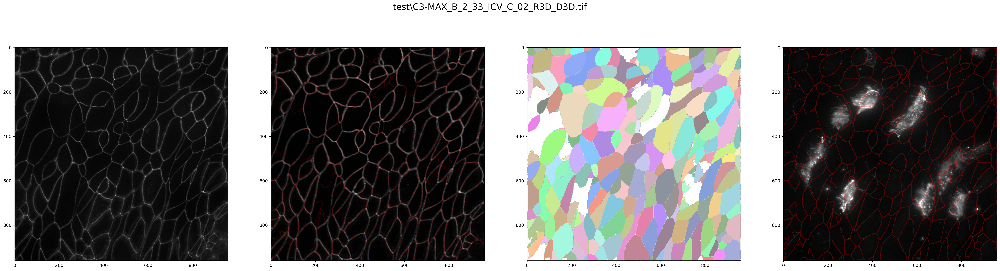

In [12]:
whichimage = 1

ex_tight_junctions = tight_junctions[whichimage]
ex_filtered = filtered[whichimage]
ex_segmentation = segmentation[whichimage]
ex_infection = infection[whichimage]

    
filesi = TJ_files[whichimage]
filename = filesi.split('/')[-1]

fig, ax = plt.subplots(1,4,figsize=(40,10))
plt.suptitle(filename, size = 20)

ax[0].imshow(ex_tight_junctions, cmap = "gray")

ax[1].imshow(ex_filtered, cmap = "gray", vmax=0.3)
ax[1].imshow(ex_segmentation["outlines"], cmap = cmap, vmin=0, vmax=1, alpha=0.4)
    
ax[2].imshow(ex_segmentation["masks"], cmap = cmap)

ax[3].imshow(ex_infection, cmap = "gray", vmax = 30000)
ax[3].imshow(ex_segmentation["outlines"], cmap = cmap, vmin=0, vmax=1, alpha=0.6)

# Save summary of segmentation for all images

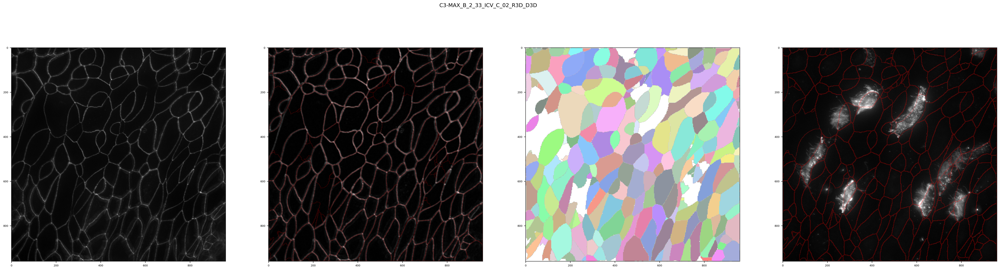

In [13]:
fig, ax = plt.subplots(1,4,figsize=(40,10))
plt.rc('xtick', labelsize=6)
plt.rc('ytick', labelsize=6) 

for idx in range(n_tight_junctions):
    ex_tight_junctions = tight_junctions[idx]
    ex_filtered = filtered[idx]
    ex_segmentation = segmentation[idx]
    ex_infection = infection[idx]

    
    filesi = TJ_files[idx]
    filename = filesi.split('\\')[-1]
    savename = filename[:-4]

    
    # clear subplots before plotting new images
    ax[0].cla()
    ax[1].cla()
    ax[2].cla()
    ax[3].cla()
    
    # plotting new images
    
    plt.suptitle(savename, size = 12)
    
    ax[0].imshow(ex_tight_junctions, cmap = "gray")

    ax[1].imshow(ex_filtered, cmap = "gray", vmax=0.3)
    ax[1].imshow(ex_segmentation["outlines"], cmap = cmap, vmin=0, vmax=1, alpha=0.4)
    
    ax[2].imshow(ex_segmentation["masks"], cmap = cmap)

    ax[3].imshow(ex_infection, cmap = "gray", vmax = 30000)
    ax[3].imshow(ex_segmentation["outlines"], cmap = cmap, vmin=0, vmax=1, alpha=0.6)
    
    plt.savefig(summary_path + "/" + savename + ".png")

# Measurments

## Tight junction mask - measure GFP channel

In [28]:
results_inf = []

for idx in range(n_infection):
    
    maski = segmentation[idx]["masks"]
    measi = infection[idx]
    filesi = GFP_files[idx]
    
    regions = skimage.measure.regionprops_table(skimage.measure.label(maski), intensity_image=measi,
                                           properties=('label','area',"perimeter",'mean_intensity', "feret_diameter_max", "major_axis_length", "minor_axis_length"))
    
    
    # additional properties:
    # feret_diameter_max: Maximum Feret’s diameter computed as the longest distance between points around a region’s convex hull contour as determined by find_contours.
    # major_axis_length: The length of the major axis of the ellipse that has the same normalized second central moments as the region.
    # minor_axis_length: The length of the minor axis of the ellipse that has the same normalized second central moments as the region.
    
    regions = pd.DataFrame(regions)
    filename = filesi.split('\\')[-1]
    regions['file'] = filename
    print(filename)
    regions["channel"] =    re.findall('(.+)-.+_.+_.+_.+_.+_.+_.+_.+\.tif',filename)[0]
    
    regions['replicate'] =      re.findall('.+-.+_(.+)_.+_.+_.+_.+_.+_.+\.tif',filename)[0]
    regions['replicate'] =  re.findall('.+_.+_(.+)_.+_.+\.tif',filename)[0]
    regions['image'] =      re.findall('.+_.+_.+_(.+)_.+\.tif',filename)[0]
    #regions['channel'] =    re.findall('.+_.+_.+_.+_(.+)\.tif',filename)[0]
    
    
    results_inf.append(regions)
    
results_infection = pd.concat(results_inf)
results_infection

C2-MAX_B_2_33_ICV_C_01_R3D_D3D.tif
C2-MAX_B_2_33_ICV_C_02_R3D_D3D.tif


,label,area,perimeter,mean_intensity,feret_diameter_max,major_axis_length,minor_axis_length,file,channel,replicate,image
0,1,3009,241.941125,4104.817880,83.486526,78.419876,52.418169,C2-MAX_B_2_33_ICV_C_01_R3D_D3D.tif,C2,01,R3D
1,2,2650,253.083261,4184.949057,81.271151,71.308014,53.906236,C2-MAX_B_2_33_ICV_C_01_R3D_D3D.tif,C2,01,R3D
2,3,2468,213.526912,4356.503647,72.069411,63.584453,51.048562,C2-MAX_B_2_33_ICV_C_01_R3D_D3D.tif,C2,01,R3D
3,4,2904,231.769553,4526.878444,77.472576,71.565371,53.622296,C2-MAX_B_2_33_ICV_C_01_R3D_D3D.tif,C2,01,R3D
4,5,1558,166.970563,5206.071887,56.302753,55.738077,37.280861,C2-MAX_B_2_33_ICV_C_01_R3D_D3D.tif,C2,01,R3D
...,...,...,...,...,...,...,...,...,...,...,...
218,219,912,155.213203,3169.561404,54.129474,49.994229,27.604747,C2-MAX_B_2_33_ICV_C_02_R3D_D3D.tif,C2,02,R3D
219,220,1529,191.355339,3333.094833,64.327288,56.734092,37.500903,C2-MAX_B_2_33_ICV_C_02_R3D_D3D.tif,C2,02,R3D
220,221,1096,153.006097,3457.041058,57.584720,51.634804,28.609815,C2-MAX_B_2_33_ICV_C_02_R3D_D3D.tif,C2,02,R3D
221,222,295,77.106602,3494.166102,27.658633,25.601057,16.044406,C2-MAX_B_2_33_ICV_C_02_R3D_D3D.tif,C2,02,R3D


In [29]:
results_infection.to_csv("results_infection.txt", header = True, index = False, sep = "\t")

In [23]:
results_inf2 = []

for idx in range(n_infection):
    
    maski = segmentation[idx]["masks"]
    measi = infection[idx]
    filesi = cilia_files[idx]
    
    regions = skimage.measure.regionprops_table(skimage.measure.label(maski), intensity_image=measi,
                                           properties=('label','area',"perimeter",'mean_intensity', "feret_diameter_max", "major_axis_length", "minor_axis_length"))
    
    
    # additional properties:
    # feret_diameter_max: Maximum Feret’s diameter computed as the longest distance between points around a region’s convex hull contour as determined by find_contours.
    # major_axis_length: The length of the major axis of the ellipse that has the same normalized second central moments as the region.
    # minor_axis_length: The length of the minor axis of the ellipse that has the same normalized second central moments as the region.
    
    regions = pd.DataFrame(regions)
    filename = filesi.split('/')[-1]
    regions['file'] = filename
    regions["experiment"] = re.findall('(.+)_.+_.+_.+_.+\.tif',filename)[0]
    regions['virus'] =      re.findall('.+_(.+)_.+_.+_.+\.tif',filename)[0]
    regions['replicate'] =  re.findall('.+_.+_(.+)_.+_.+\.tif',filename)[0]
    regions['image'] =      re.findall('.+_.+_.+_(.+)_.+\.tif',filename)[0]
    regions['channel'] =    re.findall('.+_.+_.+_.+_(.+)\.tif',filename)[0]
    
    results_inf.append(regions)
    
results_infection2 = pd.concat(results_inf)
results_infection2

,label,area,perimeter,mean_intensity,feret_diameter_max,major_axis_length,minor_axis_length,file,experiment,virus,replicate,image,channel
0,1,563,97.213203,7441.170515,31.622777,30.925483,23.837815,data\A1_-1_2_1_GFP_001.tif,data\A1_-1,2,1,GFP,001
1,2,809,131.420310,7060.245983,51.923020,49.090999,22.072127,data\A1_-1_2_1_GFP_001.tif,data\A1_-1,2,1,GFP,001
2,3,245,66.142136,7075.224490,25.495098,25.195313,12.987833,data\A1_-1_2_1_GFP_001.tif,data\A1_-1,2,1,GFP,001
3,4,1154,148.769553,8418.253033,52.392748,51.332793,30.641743,data\A1_-1_2_1_GFP_001.tif,data\A1_-1,2,1,GFP,001
4,5,362,96.556349,8591.488950,44.011362,42.557467,11.302005,data\A1_-1_2_1_GFP_001.tif,data\A1_-1,2,1,GFP,001
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8791,8792,59,29.071068,12855.118644,11.704700,11.491260,6.716684,data\P1_-1_4_1_CY5_001.tif,data\P1_-1,4,1,CY5,001
8792,8793,38,23.449747,16046.921053,10.440307,10.471301,5.149569,data\P1_-1_4_1_CY5_001.tif,data\P1_-1,4,1,CY5,001
8793,8794,56,32.485281,16166.267857,11.704700,11.470674,6.651312,data\P1_-1_4_1_CY5_001.tif,data\P1_-1,4,1,CY5,001
8794,8795,36,19.656854,15983.527778,7.615773,7.354897,6.190738,data\P1_-1_4_1_CY5_001.tif,data\P1_-1,4,1,CY5,001


In [ ]:
results_infection2.to_csv("results_infection2.txt", header = True, index = False, sep = "\t")

In [22]:
cilia_files

array(['../data\\A1_-1_4_1_CY5_001.tif', '../data\\A2_-1_4_1_CY5_001.tif',
       '../data\\B1_-1_4_1_CY5_001.tif', '../data\\P1_-1_4_1_CY5_001.tif'],
      dtype='<U29')